In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import Isomap, LocallyLinearEmbedding, TSNE, SpectralEmbedding, MDS
from sklearn.decomposition import KernelPCA
import umap.umap_ as umap
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from utils import load_graph
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import jaccard_score

In [2]:
# Interactive 3D surface plot using Plotly
def plot_interactive_3d_surface(embedding, title):
    x = embedding[:, 0]
    y = embedding[:, 1]
    z = embedding[:, 2]

    fig = go.Figure(data=[go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=1.5,
            color=z,
            colorscale='matter',
            opacity=0.8
        )
    )])

    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title='x',
            yaxis_title='y',
            zaxis_title='z'
        )
    )

    fig.show()


def plot_interactive_3d_with_links(embedding, title, k=5):
    # Compute k-nearest neighbors
    nn = NearestNeighbors(n_neighbors=k, metric="euclidean")
    nn.fit(embedding)
    _, neighbors = nn.kneighbors(embedding)

    # Extract points
    x = embedding[:, 0]
    y = embedding[:, 1]
    z = embedding[:, 2]

    # Initialize the plot
    fig = go.Figure()

    # Plot points
    fig.add_trace(go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=3,
            color=z,
            colorscale='matter',
            opacity=0.8
        ),
        name='Points'
    ))

    # Plot lines for neighbors
    for i in range(len(embedding)):
        for j in neighbors[i]:
            # Line endpoints
            fig.add_trace(go.Scatter3d(
                x=[x[i], x[j]],
                y=[y[i], y[j]],
                z=[z[i], z[j]],
                mode='lines',
                line=dict(color='lightblue', width=1),
                name='Neighbor Link',
                showlegend=False
            ))

    # Layout settings
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title='x',
            yaxis_title='y',
            zaxis_title='z'
        )
    )

    fig.show()


# Function to compute Jaccard similarity for nearest neighbors
def compute_jaccard_similarity(original_neighbors, reduced_neighbors, distance_matrix):
    # Ensure both are binary (1 for neighbor, 0 for not)
    jaccard_similarities = []
    for orig_neighbors, red_neighbors in zip(original_neighbors, reduced_neighbors):
        # Create binary vectors of size N
        orig_binary = np.zeros(len(distance_matrix))
        red_binary = np.zeros(len(distance_matrix))
        orig_binary[orig_neighbors] = 1
        red_binary[red_neighbors] = 1
        # Compute Jaccard similarity
        jaccard_similarities.append(jaccard_score(orig_binary, red_binary))
    return np.mean(jaccard_similarities)

# Function to find k-nearest neighbors in high-dimensional space
def get_nearest_neighbors(embedding, k):
    """Find the indices of k nearest neighbors for each point."""
    nn = NearestNeighbors(n_neighbors=k, metric="euclidean")
    nn.fit(embedding)
    _, indices = nn.kneighbors(embedding)
    return indices


# Load data

In [3]:
distance_matrix = np.load("/Users/damian_gerber/Library/Mobile Documents/com~apple~CloudDocs/01 - Master Mathematics/MIT/Thesis/thesis_dgerber/src/data/graph_data/D_mat.npy")
locations = np.load("/Users/damian_gerber/Library/Mobile Documents/com~apple~CloudDocs/01 - Master Mathematics/MIT/Thesis/thesis_dgerber/src/data/graph_data/locations.npy")
graph = load_graph("/Users/damian_gerber/Library/Mobile Documents/com~apple~CloudDocs/01 - Master Mathematics/MIT/Thesis/thesis_dgerber/src/data/graph_data/zurich.graphml")

In [4]:
locations = [[graph.nodes[location]["y"], graph.nodes[location]["x"]] for location in graph.nodes]
locations = np.array(locations)

In [5]:
# Number of nearest neighbors to check
k = 300

# Run the models

In [64]:
# Initialize dimensionality reduction techniques
isomap = Isomap(n_neighbors=k, n_components=3)
lle = LocallyLinearEmbedding(n_neighbors=k, n_components=3, method="standard")
tsne = TSNE(n_components=3, metric="precomputed", random_state=42, init="random", perplexity=k)
umap_reducer = umap.UMAP(n_neighbors=k, n_components=3, metric="precomputed", random_state=42)
laplacian = SpectralEmbedding(n_components=3, affinity='precomputed')
kernel_pca = KernelPCA(n_components=3, kernel='precomputed')
ltsa = LocallyLinearEmbedding(n_neighbors=k, n_components=3, method="ltsa")
mds_nm = MDS(n_components=3, dissimilarity='precomputed', random_state=42, metric=False)
mds = MDS(n_components=3, dissimilarity='precomputed', random_state=42)


# Apply dimensionality reduction
isomap_embedding = isomap.fit_transform(distance_matrix)
print("iso is done")
lle_embedding = lle.fit_transform(distance_matrix)
print("lle is done")
tsne_embedding = tsne.fit_transform(distance_matrix)
print("tsne is done")
umap_embedding = umap_reducer.fit_transform(distance_matrix)
print("umap is done")
laplacian_embedding = laplacian.fit_transform(distance_matrix)
print("laplacian is done")
kernel_pca_embedding = kernel_pca.fit_transform(distance_matrix)
print("kernel_pca is done")
ltsa_embedding = ltsa.fit_transform(distance_matrix)
print("ltsa is done")
mds_nm_embedding = mds_nm.fit_transform(distance_matrix)
print("mds_nm is done")
mds_embedding = mds.fit_transform(distance_matrix)
print("mds is done")



iso is done
lle is done
tsne is done


/opt/anaconda3/envs/ox/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/ox/lib/python3.13/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/opt/anaconda3/envs/ox/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



umap is done
laplacian is done
kernel_pca is done
ltsa is done
mds_nm is done
mds is done


# Comparison

In [65]:
# Plot surfaces
plot_interactive_3d_surface(isomap_embedding, "Isomap")
plot_interactive_3d_surface(lle_embedding, "Locally Linear Embedding (LLE)")
plot_interactive_3d_surface(tsne_embedding, "t-SNE")
plot_interactive_3d_surface(umap_embedding, "UMAP")
plot_interactive_3d_surface(laplacian_embedding, "Laplacian Eigenmaps")
plot_interactive_3d_surface(kernel_pca_embedding, "Kernel PCA")
plot_interactive_3d_surface(mds_embedding, "MDS")
plot_interactive_3d_surface(mds_nm_embedding, "MDS (Non-Metric)")
plot_interactive_3d_surface(ltsa_embedding, "Local Tangent Space Alignment (LTSA)")


In [66]:

# Find nearest neighbors in the original high-dimensional space
original_neighbors = get_nearest_neighbors(distance_matrix, k)

# Find nearest neighbors in each reduced space
isomap_neighbors = get_nearest_neighbors(isomap_embedding, k)
lle_neighbors = get_nearest_neighbors(lle_embedding, k)
tsne_neighbors = get_nearest_neighbors(tsne_embedding, k)
umap_neighbors = get_nearest_neighbors(umap_embedding, k)
laplacian_neighbors = get_nearest_neighbors(laplacian_embedding, k)

# Compute Jaccard similarities for each method
isomap_jaccard = compute_jaccard_similarity(original_neighbors, isomap_neighbors, distance_matrix)
lle_jaccard = compute_jaccard_similarity(original_neighbors, lle_neighbors, distance_matrix)
tsne_jaccard = compute_jaccard_similarity(original_neighbors, tsne_neighbors, distance_matrix)
umap_jaccard = compute_jaccard_similarity(original_neighbors, umap_neighbors, distance_matrix)
laplacian_jaccard = compute_jaccard_similarity(original_neighbors, laplacian_neighbors, distance_matrix)

# Print the Jaccard similarities
print(f"Isomap Jaccard Similarity: {isomap_jaccard}")
print(f"LLE Jaccard Similarity: {lle_jaccard}")
print(f"t-SNE Jaccard Similarity: {tsne_jaccard}")
print(f"UMAP Jaccard Similarity: {umap_jaccard}")
print(f"Laplacian Jaccard Similarity: {laplacian_jaccard}")

Isomap Jaccard Similarity: 0.8270701277674128
LLE Jaccard Similarity: 0.6326222495184566
t-SNE Jaccard Similarity: 0.601651600739334
UMAP Jaccard Similarity: 0.5211434930256684
Laplacian Jaccard Similarity: 0.12297718062025721


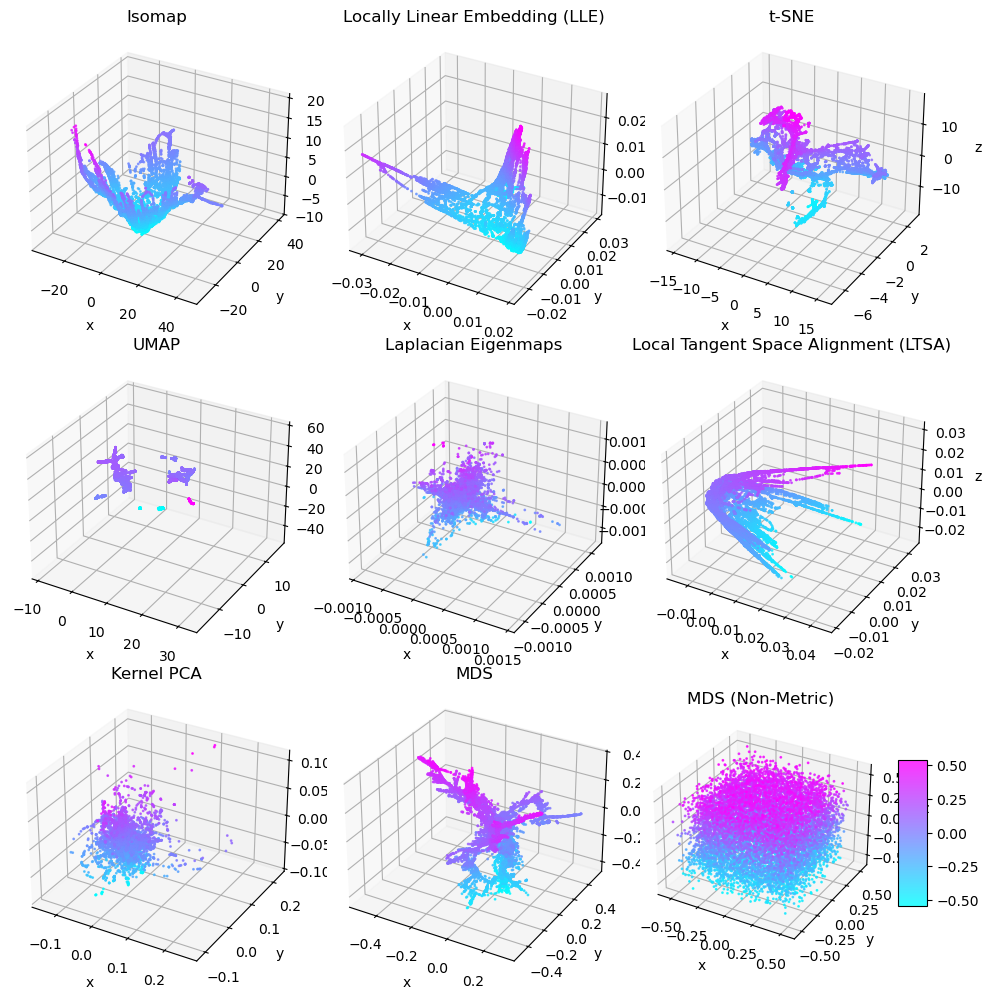

In [67]:
def plot_3d_subplots(embeddings, titles):
    fig = plt.figure(figsize=(10, 10))

    for i, (embedding, title) in enumerate(zip(embeddings, titles)):
        ax = fig.add_subplot(3, 3, i+1, projection='3d')

        x = embedding[:, 0]
        y = embedding[:, 1]
        z = embedding[:, 2]

        scatter = ax.scatter(x, y, z, c=z, cmap='cool', s=1, alpha=0.8)
        ax.set_title(title)
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.set_zlabel('z')

    # Add colorbar
    fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)

    plt.tight_layout()
    plt.show()

# Example usage
embeddings = [isomap_embedding, lle_embedding, tsne_embedding, umap_embedding, laplacian_embedding, ltsa_embedding, kernel_pca_embedding, mds_embedding, mds_nm_embedding]
titles = ["Isomap", "Locally Linear Embedding (LLE)", "t-SNE", "UMAP", "Laplacian Eigenmaps","Local Tangent Space Alignment (LTSA)", "Kernel PCA", "MDS", "MDS (Non-Metric)"]

plot_3d_subplots(embeddings, titles)


# Tests

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import MinMaxScaler
from utils import get_nearest_neighbors


def compute_jaccard_similarity(original_neighbors, reduced_neighbors, distance_matrix):
    jaccard_similarities = []
    for orig_neighbors, red_neighbors in zip(original_neighbors, reduced_neighbors):
        orig_binary = np.zeros(len(distance_matrix))
        red_binary = np.zeros(len(distance_matrix))
        orig_binary[orig_neighbors] = 1
        red_binary[red_neighbors] = 1
        jaccard_similarities.append(jaccard_score(orig_binary, red_binary))
    return np.mean(jaccard_similarities)


def compute_relative_distances(dist_matrix, original_neighbors, k=300):
    # Calculate the pairwise Euclidean distances for the original and reduced embeddings
    relative_diffs = []
    for i, neighbors in enumerate(original_neighbors):
        original_dists = dist_matrix[i, neighbors]
        reduced_dists = np.sort(dist_matrix[i])[:k]  # Nearest k neighbors in the reduced embedding
        diff = np.abs(original_dists - reduced_dists)
        relative_diffs.append(np.mean(diff))  # Compute the mean difference for the neighbors
    return np.mean(relative_diffs)


def normalize_distances(dist_matrix):
    # Normalize the distance matrix to the range [0, 1]
    scaler = MinMaxScaler()
    return scaler.fit_transform(dist_matrix)

Running LLE for dimension 40
Computing metrics for dimension 40
Reconstruction error is 0.005270515140561315
Jaccard score is 0.5312654625182985
Relative distance error is 0.07700708799740937
Running LLE for dimension 30
Computing metrics for dimension 30
Reconstruction error is 0.0016158565785911391
Jaccard score is 0.5453899525538415
Relative distance error is 0.06197433705988097
Running LLE for dimension 20
Computing metrics for dimension 20
Reconstruction error is 0.00028847518814742153
Jaccard score is 0.56804359049593
Relative distance error is 0.05126641208193923
Running LLE for dimension 10
Computing metrics for dimension 10
Reconstruction error is 1.8238983234898157e-05
Jaccard score is 0.636173379742745
Relative distance error is 0.03158621587231581
Running LLE for dimension 9
Computing metrics for dimension 9
Reconstruction error is 1.17401137177552e-05
Jaccard score is 0.6457895234565607
Relative distance error is 0.027806318541999737
Running LLE for dimension 8
Computing m

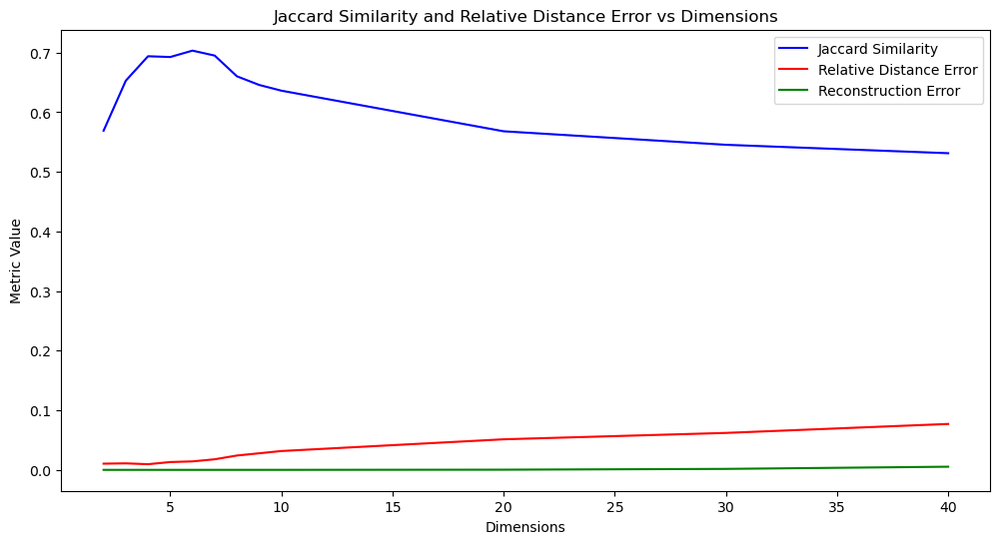

In [7]:
k = 200  # Number of neighbors # Example distance matrix, replace with actual data
original_neighbors = get_nearest_neighbors(distance_matrix, k)

# Dimensions to check
dimensions = [40, 30, 20, 10, 9, 8, 7, 6, 5, 4, 3, 2]

# Lists to store results
jaccard_scores_dim = []
distance_errors_dim = []
rec_error_dim = []

for dim in dimensions:
    # Apply LLE for the current dimension
    print(f"Running LLE for dimension {dim}")
    lle = LocallyLinearEmbedding(n_neighbors=k, n_components=dim, method="standard")
    reduced_embedding = lle.fit_transform(distance_matrix)

    # Compute the reduced neighbors using the normalized embedding
    reduced_neighbors = get_nearest_neighbors(reduced_embedding, k)

    dist_matrix_emb = pairwise_distances(reduced_embedding)
    dist_matrix_emb = normalize_distances(dist_matrix_emb)

    print(f"Computing metrics for dimension {dim}")
    rec_error = lle.reconstruction_error_
    rec_error_dim.append(rec_error)
    print(f"Reconstruction error is {rec_error}")

    # Compute Jaccard Similarity
    jaccard_similarity = compute_jaccard_similarity(original_neighbors, reduced_neighbors, distance_matrix)
    jaccard_scores_dim.append(jaccard_similarity)
    print(f"Jaccard score is {jaccard_similarity}")

    # Compute relative distance differences for nearest neighbors
    relative_distance_error = compute_relative_distances(dist_matrix_emb, original_neighbors, k)
    distance_errors_dim.append(relative_distance_error)
    print(f"Relative distance error is {relative_distance_error}")

# Plot the Jaccard similarity and relative distance error across dimensions
plt.figure(figsize=(12, 6))
plt.plot(dimensions, jaccard_scores_dim, label='Jaccard Similarity', color='blue')
plt.plot(dimensions, distance_errors_dim, label='Relative Distance Error', color='red')
plt.plot(dimensions, rec_error_dim, label='Reconstruction Error', color='green')
plt.xlabel('Dimensions')
plt.ylabel('Metric Value')
plt.title('Jaccard Similarity and Relative Distance Error vs Dimensions')
plt.legend()
plt.show()


In [8]:
rec_error_dim

[np.float64(0.005270515140561315),
 np.float64(0.0016158565785911391),
 np.float64(0.00028847518814742153),
 np.float64(1.8238983234898157e-05),
 np.float64(1.17401137177552e-05),
 np.float64(6.031506608995458e-06),
 np.float64(3.462062236003203e-06),
 np.float64(2.066255814334152e-06),
 np.float64(1.054313954711673e-06),
 np.float64(4.5629768253406225e-07),
 np.float64(1.9104291566062983e-07),
 np.float64(2.4881428027614135e-08)]

In [9]:
dimensions

[40, 30, 20, 10, 9, 8, 7, 6, 5, 4, 3, 2]